In [4]:
import numpy as np
import pandas as pd


import os
for dirname, _, filenames in os.walk('/content'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/content/PaviaU.mat
/content/PaviaU_gt.mat
/content/Indian_pines_gt.mat
/content/Indian_pines.mat
/content/.config/hidden_gcloud_config_universe_descriptor_data_cache_configs.db
/content/.config/.last_update_check.json
/content/.config/.last_opt_in_prompt.yaml
/content/.config/active_config
/content/.config/.last_survey_prompt.yaml
/content/.config/config_sentinel
/content/.config/gce
/content/.config/default_configs.db
/content/.config/logs/2025.04.04/13.37.49.519497.log
/content/.config/logs/2025.04.04/13.37.48.348005.log
/content/.config/logs/2025.04.04/13.37.59.170918.log
/content/.config/logs/2025.04.04/13.37.18.676175.log
/content/.config/logs/2025.04.04/13.37.39.652154.log
/content/.config/logs/2025.04.04/13.37.58.423894.log
/content/.config/configurations/config_default
/content/sample_data/README.md
/content/sample_data/anscombe.json
/content/sample_data/california_housing_train.csv
/content/sample_data/california_housing_test.csv
/content/sample_data/mnist_test.csv
/content/s

In [5]:
from sklearn.decomposition import PCA
import scipy.io as sio
import scipy.ndimage
import matplotlib.pyplot as plt
import scipy

Data Loading

In [6]:
indian_pines_path="/content/Indian_pines.mat"
indian_pines_gt_path="/content/Indian_pines_gt.mat"
pavia_university_path="/content/PaviaU.mat"
pavia_university_gt_path="/content/PaviaU_gt.mat"

indian_pines_data = sio.loadmat(indian_pines_path)['indian_pines']
indian_pines_gt = sio.loadmat(indian_pines_gt_path)['indian_pines_gt']

pavia_university_data = sio.loadmat(pavia_university_path)['paviaU']
pavia_university_gt = sio.loadmat(pavia_university_gt_path)['paviaU_gt']

# Data Exploration

# Indian Pine
Indian Pines is a Hyperspectral image segmentation dataset. The input data consists of hyperspectral bands over a single landscape in Indiana, US, (Indian Pines data set) with 145×145 pixels. For each pixel, the data set contains 220 spectral reflectance bands which represent different portions of the electromagnetic spectrum in the wavelength range 0.4−2.5⋅10−6.

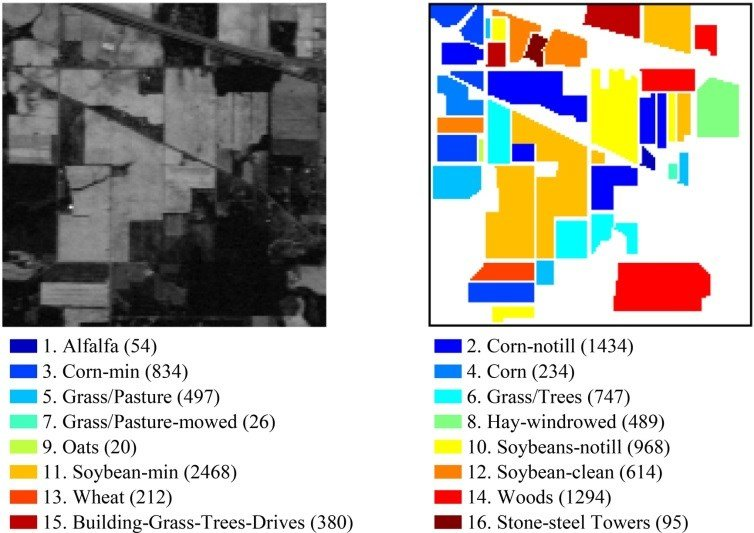

*The Indian Pines data set: band 150 out of 200 bands (left) and the 16-class ground reference map (right) with number of samples in each class shown at the bottom.*

The Indian Pines scene contains two-thirds agriculture, and one-third forest or other natural perennial vegetation. There are two major dual lane highways, a rail line, as well as some low density housing, other built structures, and smaller roads. Since the scene is taken in June some of the crops present, corn, soybeans, are in early stages of growth with less than 5% coverage.

The ground truth available is designated into sixteen classes:

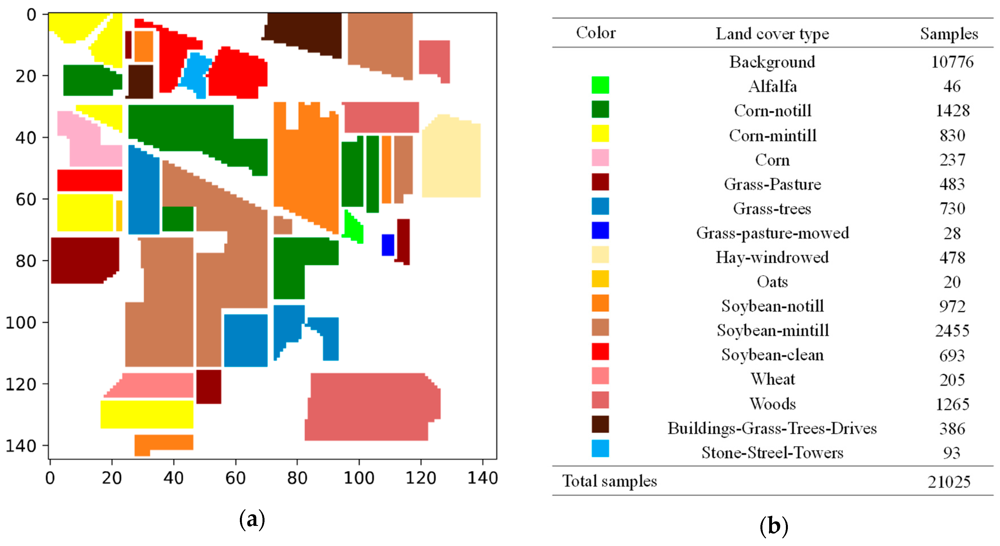

# Pavia University
The Pavia University dataset is a hyperspectral image dataset which gathered by a sensor known as the reflective optics system imaging spectrometer (ROSIS-3) over the city of Pavia, Italy. The image consists of 610×340 pixels with 115 spectral bands. The image is divided into 9 classes with a total of 42,776 labelled samples, including the asphalt, meadows, gravel, trees, metal sheet, bare soil, bitumen, brick, and shadow.

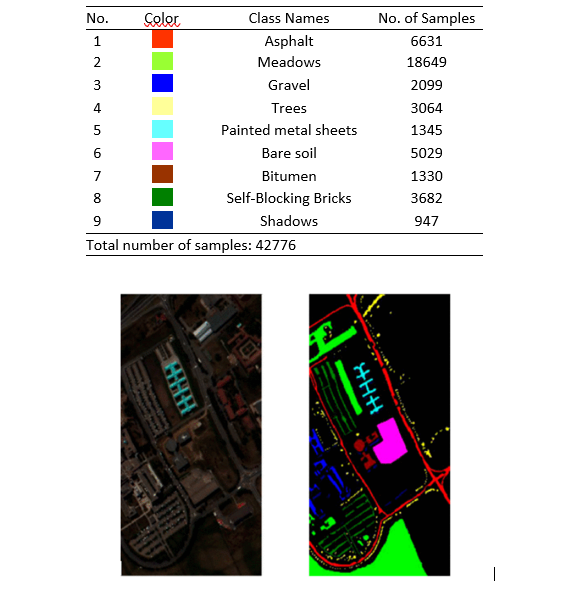

In [7]:
datasets = [(indian_pines_data, indian_pines_gt, "Indian Pines"),
            (pavia_university_data, pavia_university_gt, "Pavia University")]
def get_dataset_info(dataset_name, dataset, ground_truth):
    print(f"Dataset: {dataset_name}")
    print(f"Dimensions (width, height, bands): {dataset.shape}")
    print(f"Number of Bands: {dataset.shape[2]}")
    print(f"Ground Truth Classes: {np.unique(ground_truth)}")
    print()

for dataset, ground_truth, dataset_name in datasets:
    get_dataset_info(dataset_name, dataset, ground_truth)

Dataset: Indian Pines
Dimensions (width, height, bands): (145, 145, 220)
Number of Bands: 220
Ground Truth Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]

Dataset: Pavia University
Dimensions (width, height, bands): (610, 340, 103)
Number of Bands: 103
Ground Truth Classes: [0 1 2 3 4 5 6 7 8 9]



The number of samples for each class

In [8]:
for X, y, dataset_name in datasets:
    print(f"Dataset: {dataset_name}")
    # Get unique class names based on ground truth labels for the current dataset
    class_names = np.unique(y)
    # Calculate the number of samples for each class
    summary = pd.DataFrame([{'class_name': label, 'samples': np.sum(y == val)} for val, label in enumerate(class_names)])
    print(summary)
    print()

Dataset: Indian Pines
    class_name  samples
0            0    10776
1            1       46
2            2     1428
3            3      830
4            4      237
5            5      483
6            6      730
7            7       28
8            8      478
9            9       20
10          10      972
11          11     2455
12          12      593
13          13      205
14          14     1265
15          15      386
16          16       93

Dataset: Pavia University
   class_name  samples
0           0   164624
1           1     6631
2           2    18649
3           3     2099
4           4     3064
5           5     1345
6           6     5029
7           7     1330
8           8     3682
9           9      947



# Data Visualization
## Class Distribution Visualization:
* Reveals imbalanced classes
* Shows which land cover types dominate the scene
* Helps identify rare classes that might need special handling



In [9]:
import plotly.graph_objects as go

def plot_class_distribution(data, ground_truth, dataset_name):
    # Compute unique classes and their counts
    unique_classes, class_counts = np.unique(ground_truth, return_counts=True)

    # Create bar chart using Plotly
    fig = go.Figure(data=[
        go.Bar(x=unique_classes, y=class_counts, marker_color='indigo')
    ])

    fig.update_layout(
        title=f'{dataset_name} Class Distribution',
        xaxis_title='Class',
        yaxis_title='Number of Samples',
        xaxis=dict(tickmode='linear'),
        template='plotly_white'
    )

    fig.show()

for data, ground_truth, name in datasets:
    plot_class_distribution(data, ground_truth, name)


from these plots we could say that the distribution of classes isn't uniform some classes are rarely found in the image like class 1 (46),7 (28) and 9 (20) in case of Indian Pine dataset and class 3 (2099) , 5 (1345) , 7 (1330) and 9 (947) in case of Pavia University dataset compared to other classes

In [10]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_selected_bands(dataset_name, dataset, band_indices):
    try:
        # Validate dimensions
        if dataset.ndim != 3:
            raise ValueError(f"Dataset '{dataset_name}' must be a 3D array (H, W, Bands). Got shape: {dataset.shape}")

        max_band = dataset.shape[2]
        for b in band_indices:
            if b < 0 or b >= max_band:
                raise IndexError(f"Band index {b} is out of bounds for dataset '{dataset_name}' with {max_band} bands.")

        num_bands = len(band_indices)
        cols = 5
        rows = num_bands // cols + (1 if num_bands % cols != 0 else 0)

        fig = make_subplots(
            rows=rows, cols=cols,
            subplot_titles=[f'Band {b}' for b in band_indices],
            horizontal_spacing=0.03, vertical_spacing=0.08
        )

        for i, band_idx in enumerate(band_indices):
            row = i // cols + 1
            col = i % cols + 1
            band_data = dataset[:, :, band_idx]

            fig.add_trace(
                go.Heatmap(
                    z=band_data,
                    colorscale='Jet',
                    showscale=False
                ),
                row=row, col=col
            )

        fig.update_layout(
            height=rows * 300,
            width=1200,
            title_text=f'Visualizing Selected Bands for {dataset_name} Dataset',
            showlegend=False,
            template='plotly_white'
        )

        fig.show()

    except IndexError as ie:
        print(f"[IndexError] {ie}")
    except ValueError as ve:
        print(f"[ValueError] {ve}")
    except Exception as e:
        print(f"[Error] An unexpected error occurred while visualizing '{dataset_name}': {e}")


indian_pines_selected_bands = [5, 20, 80, 140, 180]
pavia_university_selected_bands = [10, 30, 70, 90, 100]

visualize_selected_bands("Indian Pines", indian_pines_data, indian_pines_selected_bands)

visualize_selected_bands("Pavia University", pavia_university_data, pavia_university_selected_bands)

## Class-specific Spectral Signatures:


*   Visualizes how different materials reflect light differently
*   Shows which spectral bands are most discriminative
*   Reveals class separability in spectral space
*   Error bands show variability within each class

In [11]:
! pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.8 MB/s eta 0:00:00


In [12]:
import plotly.graph_objects as go

def plot_spectral_signatures(data, ground_truth, dataset_name):
    try:
        if data.ndim != 3 or ground_truth.ndim != 2:
            raise ValueError(f"Expected data shape (H, W, Bands) and ground_truth shape (H, W). Got {data.shape} and {ground_truth.shape}")

        # Reshape data
        height, width, bands = data.shape
        data_reshaped = data.reshape(-1, bands)
        labels_reshaped = ground_truth.flatten()

        unique_classes = np.unique(labels_reshaped)
        fig = go.Figure()

        for cls in unique_classes:
            if cls == 0:
                continue  # Often background
            cls_indices = np.where(labels_reshaped == cls)[0]
            cls_samples = data_reshaped[cls_indices]
            avg_spectrum = np.mean(cls_samples, axis=0)

            fig.add_trace(go.Scatter(
                y=avg_spectrum,
                mode='lines',
                name=f'Class {cls}',
                hovertemplate=f'Band {{x}}<br>Intensity {{y:.2f}}<extra>Class {cls}</extra>'
            ))

        fig.update_layout(
            title=f'Class-specific Spectral Signatures ({dataset_name})',
            xaxis_title='Band Index',
            yaxis_title='Average Intensity',
            template='plotly_white',
            height=600,
            width=900
        )
        fig.show()
        '''if True:
            safe_name = dataset_name.lower().replace(" ", "_")
            fig.write_image(f"{safe_name}_spectral_signatures.png")
            print(f"[Saved] Graph saved as '{safe_name}_spectral_signatures.html' and .png")'''


    except Exception as e:
        print(f"[Error] Failed to plot spectral signatures for {dataset_name}: {e}")
for data, ground_truth, name in datasets:
    plot_spectral_signatures(data, ground_truth, name)



## 1. Pavia University Spectral Signatures Analysis

### Key Observations:

#### General Pattern:
- All classes show similar overall reflectance patterns with peaks around bands **20-40** and **60-80**
- Reflectance values range from **0 to ~5000** (digital number scale)

#### Distinctive Classes:
| Class | Name            | Signature Characteristics                     |
|-------|-----------------|-----------------------------------------------|
| 1     | Asphalt         | Lowest reflectance, flat signature            |
| 2     | Meadows         | Highest reflectance (especially NIR 60-80)    |
| 5     | Painted Metal   | Unique "double peak" at bands 30 and 70       |
| 9     | Shadows         | Nearly flat line at bottom                    |

#### Notable Features:
- **Visible-NIR Transition (band ~40)**: Vegetation classes (2,4) show characteristic "red edge" rise
- **Water Absorption Bands**: Minor dips at bands 50 and 90

#### Class Separability:
✅ **Excellent separation**: Asphalt (1) vs Meadows (2)  
⚠️ **Potential confusion**: Gravel (3) vs Bare Soil (6) in mid-range bands

---

## 2. Indian Pines Spectral Signatures Analysis


### Key Observations:

#### General Pattern:
- Wider spectral range (**0-7000 DN**) with more variability
- **200+ bands** show detailed spectral features
- Strong water absorption valleys at bands **~50, ~100, ~150**

#### Vegetation Classes:
| Class Group | Classes      | Signature Characteristics                     |
|-------------|--------------|-----------------------------------------------|
| Corn        | 2-4          | Similar patterns, different magnitudes       |
| Soybean     | 10-12        | Nearly identical signatures                  |
| Woods       | 14           | High NIR plateau (bands 80-150)              |

#### Non-Vegetation Classes:
| Class | Name         | Signature Characteristics                     |
|-------|--------------|-----------------------------------------------|
| 15    | Buildings    | Flat signature, moderate reflectance          |
| 16    | Stone-Steel  | Unique "spiky" pattern with sharp peaks       |

#### Critical Spectral Regions:
| Region        | Bands      | Importance                                  |
|---------------|------------|---------------------------------------------|
| Visible       | 1-50       | Vegetation vs non-vegetation separation     |
| SWIR          | 150-200    | Crop type discrimination                   |
| Red Edge      | ~70        | Vegetation health assessment               |

#### Problematic Classes:
⚠️ **Wheat (13) and Soybean (10-12)**: Near-identical signatures  
⚠️ **Grass classes (5-7)**: Significant overlap in mid-range bands

---

## Comparative Analysis

| Feature                | Pavia University                     | Indian Pines                          |
|------------------------|--------------------------------------|---------------------------------------|
| **Spectral Resolution**| ~100 bands                           | 200+ bands                            |
| **DN Range**          | 0-5000                             | 0-7000                               |
| **Key Separability**  | Visible-NIR transition (band 40)    | SWIR region (bands 150-200)          |
| **Most Distinct**     | Meadows vs Asphalt                  | Woods vs Crops                       |
| **Most Confusable**   | Gravel vs Bare Soil                 | Soybean variants                     |
| **Unique Features**   | Metal's double peak                 | Stone-Steel's spiky pattern          |


## Ground-Truth Image

In [13]:
import numpy as np
import plotly.graph_objects as go
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

def plot_ground_truth(ground_truth_data, dataset_name):
    # Define color palettes for each dataset
    if dataset_name == "Indian Pines":
        palette = plt.get_cmap('tab20')
        class_colors = {
            0: [0, 0, 0],           # Background
            1: [int(c*255) for c in palette(0)[:3]],  # Alfalfa
            2: [int(c*255) for c in palette(1)[:3]],  # Corn-notill
            3: [int(c*255) for c in palette(2)[:3]],  # Corn-mintill
            4: [int(c*255) for c in palette(3)[:3]],  # Corn
            5: [int(c*255) for c in palette(4)[:3]],  # Grass-pasture
            6: [int(c*255) for c in palette(5)[:3]],  # Grass-trees
            7: [int(c*255) for c in palette(6)[:3]],  # Grass-pasture-mowed
            8: [int(c*255) for c in palette(7)[:3]],  # Hay-windrowed
            9: [int(c*255) for c in palette(8)[:3]],  # Oats
            10: [int(c*255) for c in palette(9)[:3]], # Soybean-notill
            11: [int(c*255) for c in palette(10)[:3]], # Soybean-mintill
            12: [int(c*255) for c in palette(11)[:3]], # Soybean-clean
            13: [int(c*255) for c in palette(12)[:3]], # Wheat
            14: [int(c*255) for c in palette(13)[:3]], # Woods
            15: [int(c*255) for c in palette(14)[:3]], # Buildings
            16: [int(c*255) for c in palette(15)[:3]]  # Stone-Steel-Towers
        }
    elif dataset_name == "Pavia University":
        palette = plt.get_cmap('Set1')
        class_colors = {
            0: [255, 255, 255],     # Unclassified
            1: [int(c*255) for c in palette(0)[:3]],  # Asphalt
            2: [int(c*255) for c in palette(1)[:3]],  # Meadows
            3: [int(c*255) for c in palette(2)[:3]],  # Gravel
            4: [int(c*255) for c in palette(3)[:3]],  # Trees
            5: [int(c*255) for c in palette(4)[:3]],  # Painted metal
            6: [int(c*255) for c in palette(5)[:3]],  # Bare Soil
            7: [int(c*255) for c in palette(6)[:3]],  # Bitumen
            8: [int(c*255) for c in palette(7)[:3]],  # Bricks
            9: [0, 0, 0]            # Shadows
        }
    else:
        print("Dataset not recognized.")
        return

    # Create RGB image
    rgb_image = np.zeros((*ground_truth_data.shape, 3), dtype=np.uint8)
    for class_label, color in class_colors.items():
        mask = (ground_truth_data == class_label)
        rgb_image[mask] = color

    # Create Plotly figure
    fig = go.Figure()

    # Add image trace
    fig.add_trace(go.Image(z=rgb_image))

    # Create legend items
    unique_classes = np.unique(ground_truth_data)
    legend_items = []
    for class_id in unique_classes:
        if class_id in class_colors:
            color = f'rgb({class_colors[class_id][0]}, {class_colors[class_id][1]}, {class_colors[class_id][2]})'
            legend_items.append(
                go.Scatter(
                    x=[None], y=[None],
                    mode='markers',
                    marker=dict(size=10, color=color),
                    name=f'Class {class_id}',
                    hoverinfo='none'
                )
            )

    # Add legend items
    for item in legend_items:
        fig.add_trace(item)

    # Update layout with title underneath
    fig.update_layout(
        margin=dict(l=20, r=20, b=100, t=20),  # Extra bottom margin for title
        height=650,
        width=800,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=-0.3,  # Position legend below the image
            xanchor="center",
            x=0.5
        ),
        annotations=[
            dict(
                x=0.5,
                y=-0.15,  # Position title below the legend
                xref="paper",
                yref="paper",
                text=f"Ground Truth Classification ({dataset_name})",
                showarrow=False,
                font=dict(
                    size=16,
                    family="Arial, sans-serif",
                    color="black"
                ),
                align="center"
            )
        ]
    )

    # Hide axes
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)

    fig.show()


for dataset, ground_truth, dataset_name in datasets:
    plot_ground_truth(ground_truth, dataset_name)

## Class Separability Analysis (linear discriminant analysis)

In [14]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import plotly.express as px


def plot_class_separability(hsi_data, ground_truth, dataset_name):
    X = hsi_data.reshape(-1, hsi_data.shape[-1])
    y = ground_truth.flatten()

    # Remove background/unclassified
    X = X[y > 0]
    y = y[y > 0]
    # Calculate LDA projections
    lda = LinearDiscriminantAnalysis(n_components=min(X.shape[1], len(np.unique(y)) - 1))
    X_lda = lda.fit_transform(X, y)
    fig = px.scatter(
        x=X_lda[:,0], y=X_lda[:,1],
        color=y,
        title=f"LDA Class Separability - {dataset_name}",
        labels={'color': 'Class'},
        opacity=0.7
    )

    fig.update_layout(
        xaxis_title='LDA Component 1',
        yaxis_title='LDA Component 2',
        height=600
    )
    fig.show()
for dataset, ground_truth, dataset_name in datasets:
    plot_class_separability(dataset, ground_truth, dataset_name)

## Vegetation Index Analysis

**Pourquoi utiliser l'NDVI ?**

L'NDVI est largement utilisé dans des domaines comme l'agriculture, l'écologie, la gestion des ressources naturelles, et la surveillance environnementale pour plusieurs raisons :

Distinction de la végétation : L'NDVI permet de différencier efficacement les zones couvertes par de la végétation de celles qui ne le sont pas (eau, sol nu, etc.). En effet, la végétation a des propriétés uniques de réflexion de la lumière dans le spectre visible et infrarouge.

Mesure de la santé des plantes : La valeur de l'NDVI est liée à la quantité de chlorophylle présente dans la végétation, ce qui reflète la santé et la vigueur des plantes. Plus la végétation est saine, plus l'NDVI sera élevé.

Facilité d'interprétation : L'NDVI est un indice normalisé qui varie entre -1 et 1. Cette normalisation permet de le comparer à travers différentes zones géographiques et différentes périodes temporelles.

**Formule et interprétation**

L'NDVI est calculé à partir des valeurs de réflexion de la lumière dans deux bandes spectrales spécifiques :

Bande rouge (Red) : Cette bande capte la lumière dans le spectre visible, où la végétation absorbe fortement la lumière (en particulier à la longueur d'onde du rouge) pour la photosynthèse.

Bande proche infrarouge (NIR - Near InfraRed) : Cette bande capte la lumière dans le spectre proche infrarouge, où la végétation réfléchit fortement cette lumière.

La formule est la suivante :

NDVI = (NIR - Red) / (NIR + Red + 1e-10)

Cette formule produit un indice qui varie entre :

NDVI ≈ 1 pour une végétation dense et saine (forte réflexion dans le NIR et faible réflexion dans le rouge).

NDVI ≈ 0 pour des sols nus ou des zones non végétalisées (réflexion similaire dans les deux bandes).

NDVI ≈ -1 pour les surfaces d'eau ou les zones sans végétation (très faible réflexion dans les deux bandes).

In [15]:
def plot_vegetation_index(hsi_data, dataset_name):
    #if dataset_name == "Indian Pines":
        # Assuming bands are in standard order (red = band 50, NIR = band 90)
        red = hsi_data[..., 49]
        nir = hsi_data[..., 89]
        ndvi = (nir - red) / (nir + red + 1e-10)

        fig = px.imshow(
            ndvi,
            title=f"NDVI Analysis - {dataset_name}",
            color_continuous_scale='RdYlGn',
            zmin=-1,
            zmax=1
        )

        fig.update_layout(
            coloraxis_colorbar=dict(
                title="NDVI Value",
                tickvals=[-1, 0, 1],
                ticktext=["Water/Barren", "Soil", "Vegetation"]
            ),
            height=600
        )
        fig.show()

for dataset, ground_truth, dataset_name in datasets:
    plot_vegetation_index(dataset, dataset_name)

# PCA


PCA (Principal Component Analysis) allows to:

* Reduce dimensionality while preserving essential information.
* Capture the maximum variance of the data in a reduced space.
* Improve the efficiency of learning algorithms by reducing the size of the data.


In [16]:
def normalize_data(raw_data):
    max_value = np.max(raw_data)
    min_value = np.min(raw_data)
    normalized_data = (raw_data - min_value) / (max_value - min_value)
    return normalized_data

indian_pines_normalized = normalize_data(indian_pines_data)
pavia_university_normalized = normalize_data(pavia_university_data)

In [17]:
import numpy as np
import plotly.graph_objects as go
from sklearn.decomposition import PCA

def plot_cumulative_variance_ratio(flattened_data, dataset_name, threshold=0.97):
    pca = PCA()
    pcX = pca.fit_transform(flattened_data)
    ev = pca.explained_variance_ratio_
    cumulative_var = np.cumsum(ev)

    # Find the number of components corresponding to the threshold
    intersection_index = np.where(cumulative_var >= threshold)[0][0]
    intersection_value = cumulative_var[intersection_index]

    # Create the plot
    fig = go.Figure()

    # Plot the cumulative explained variance curve
    fig.add_trace(go.Scatter(x=np.arange(1, len(cumulative_var)+1), y=cumulative_var, mode='lines', name='Cumulative Explained Variance'))

    # Add the threshold line
    fig.add_trace(go.Scatter(
        x=[1, len(cumulative_var)], y=[threshold, threshold], mode='lines',
        line=dict(color='red', dash='dash'), name=f'{int(threshold * 100)}% Variance Threshold'
    ))

    # Add the vertical line at the intersection
    fig.add_trace(go.Scatter(
        x=[intersection_index+1, intersection_index+1], y=[0, intersection_value],
        mode='lines', line=dict(color='blue', dash='dot'), name='Intersection Line'
    ))

    # Annotate the intersection
    fig.add_annotation(
        x=intersection_index+1, y=intersection_value,
        text=f'PC{intersection_index+1}', showarrow=True, arrowhead=2, ax=0, ay=-40
    )

    # Update layout
    fig.update_layout(
        title=f'Cumulative Explained Variance Ratio for {dataset_name}',
        xaxis_title='Number of Principal Components',
        yaxis_title='Cumulative Explained Variance Ratio',
        showlegend=True,
        height=600,
        width=800,
        template='plotly_white'
    )

    fig.show()

# Reshape or flatten the datasets
indian_pines_flattened = indian_pines_normalized.reshape(-1, indian_pines_normalized.shape[-1])
pavia_university_flattened = pavia_university_normalized.reshape(-1, pavia_university_normalized.shape[-1])

plot_cumulative_variance_ratio(indian_pines_flattened, "Indian Pines")
plot_cumulative_variance_ratio(pavia_university_flattened, "Pavia University")


The cumulative variance explained plot shows a rapid increase in the first few principal components, followed by a gradual plateau. This indicates that the first components capture most of the variance in the original hyperspectral data.

In our case (Indian Pines) , the curve starts to flatten around the 10th component, where approximately 97% of the total variance is already explained. This suggests that the remaining components contribute minimally and may mostly represent noise or redundant information.

Therefore, we chose to retain the first 10 principal components, which provide a compact yet information-rich representation of the original data. This dimensionality reduction not only simplifies further processing and visualization but also helps improve the performance and training speed of subsequent classification models.

The same goes for the Pavia University dataset, where the first 3 principal components capture approximately 97% of the total variance. This justifies our decision to reduce the data to 3 components for this scene while still preserving almost all relevant information.


In [18]:
from sklearn.decomposition import PCA

def dimension_PCA(data, input_dimension):
    # Reshape the data into a 2D array (samples x features)
    num_samples, num_features, num_bands = data.shape
    flattened_data = data.reshape(num_samples * num_features, num_bands)

    # Apply PCA to the flattened data
    pca = PCA(n_components=input_dimension)
    pca.fit(flattened_data)

    # Transform the data back to the original shape
    transformed_data = pca.transform(flattened_data)
    whole_pca = transformed_data.reshape(num_samples, num_features, input_dimension)

    return whole_pca


indian_pines_pca = dimension_PCA(indian_pines_normalized, 10)
pavia_university_pca = dimension_PCA(pavia_university_normalized, 3)

print(indian_pines_pca.shape)
print(pavia_university_pca.shape)

(145, 145, 10)
(610, 340, 3)


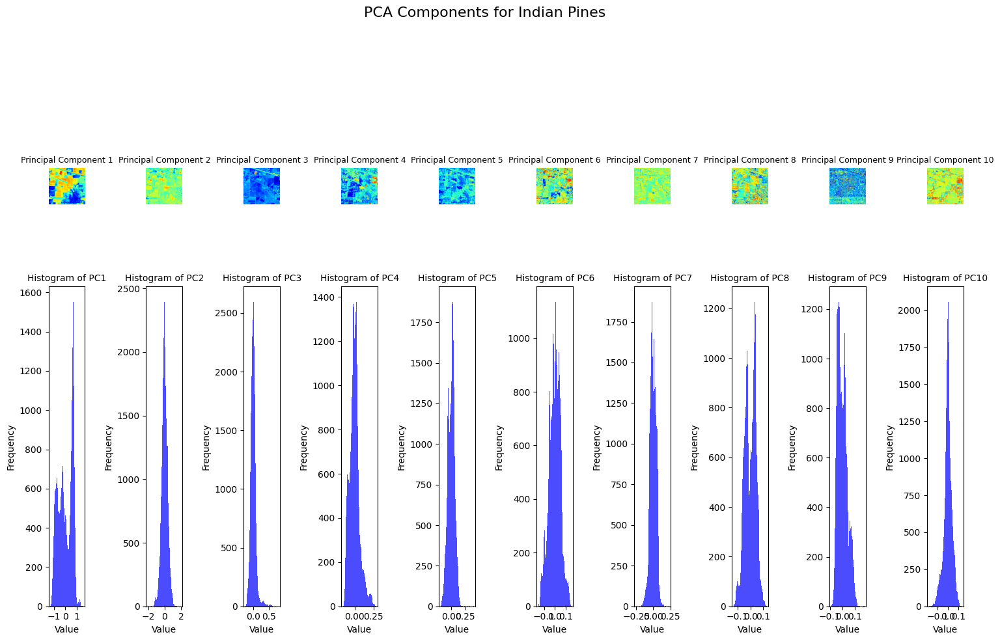

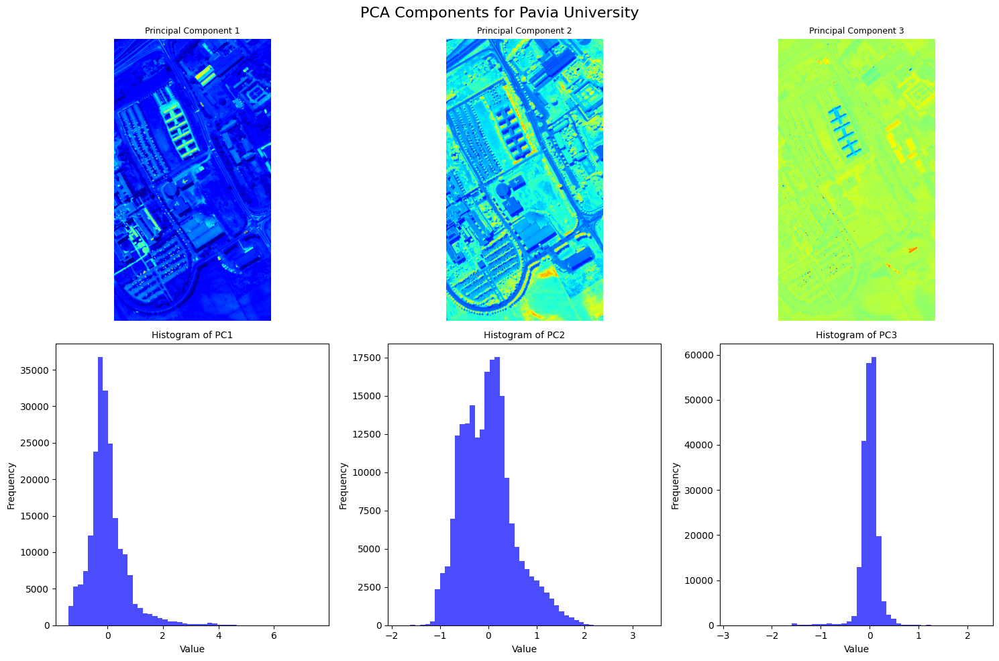

In [25]:
import matplotlib.pyplot as plt
import numpy as np

def plot_pca_components(pca_data, dataset_name, num_components=3):
    fig, axes = plt.subplots(2, num_components, figsize=(15, 10))

    for i in range(num_components):
        # Plot the PCA component image
        axes[0, i].imshow(pca_data[:, :, i], cmap='jet')
        axes[0, i].set_title(f'Principal Component {i+1}',fontsize=9)
        axes[0, i].axis('off')

        # Plot the histogram for the PCA component
        axes[1, i].hist(pca_data[:, :, i].flatten(), bins=50, color='blue', alpha=0.7)
        axes[1, i].set_title(f'Histogram of PC{i+1}', fontsize=10)
        axes[1, i].set_xlabel('Value')
        axes[1, i].set_ylabel('Frequency')

    fig.suptitle(f'PCA Components for {dataset_name}', fontsize=16)
    plt.tight_layout()
    plt.show()

# Plot the PCA components and histograms for both datasets
plot_pca_components(indian_pines_pca, 'Indian Pines', indian_pines_pca.shape[2])
plot_pca_components(pavia_university_pca, 'Pavia University', pavia_university_pca.shape[2])


## Results Analysis - Indian Pines

### Principal Components Visualization (Indian Pines)
- The **first components (PC1 to PC5)** show a **good spatial separation** with strong contrast, capturing major differences between soil and vegetation types.
- From **PC6** onwards, the components become increasingly **grainy**, showing finer details or **low noise**.

#### Interpretation of Components:
- **PC1 to PC5:** Main information about the **large agricultural areas** and parcel structure.
- **PC6 to PC10:** More subtle or noisy information, showing **finer variations** and less useful for global classification.

---

### Histogram Analysis (Indian Pines)
- The histograms of the first components (PC1 to PC5) show **wider distributions**, indicating **high variability**.
- The last components (PC6 to PC10) show **tighter histograms**, indicating that the values are concentrated around a mean, reflecting **higher noise** or less significant details.

---


### Principal Components Visualization (Pavia University)
- The **first three principal components** show well-defined **textures and structures**:
  - **PC1:** Primarily captures **urban areas and roads**.
  - **PC2:** Shows **vegetation variations**.
  - **PC3:** Appears more **uniform**, capturing **less distinct variations**.

#### Histogram Analysis (Pavia University)
- The histograms show that **PC1** has a wider distribution, while **PC2 and PC3** are more concentrated around the mean, indicating that **PC1** is more significant for differentiating the zones.

---

## Comparison between Indian Pines and Pavia University

| Aspect               | Indian Pines                           | Pavia University                       |
|----------------------|-----------------------------------------|----------------------------------------|
| Number of Components | 10                                     | 3                                      |
| Explained Variance   | Mostly captured in 10 components        | Over 95% captured in just 3 components |
| Data Nature          | Agricultural and vegetative zones       | Urban areas with green spaces         |
| Pseudo-RGB           | Dominant blue and green tones           | Blue-green dominance with red areas    |
| Characteristics      | More uniform texture                    | Strong contrasts between built and vegetated areas |


## Factor Analysis
Factor Analysis is a method for modeling observed variables, and their covariance structure, in terms of a smaller number of underlying unobservable (latent) “factors.” The factors typically are viewed as broad concepts or ideas that may describe an observed phenomenon.

The method is similar to principal components although, as the textbook points out, factor analysis is more elaborate. In one sense, factor analysis is an inversion of principal components. In factor analysis, we model the observed variables as linear functions of the “factors.” In principal components, we create new variables that are linear combinations of the observed variables.  In both PCA and FA, the dimension of the data is reduced. Recall that in PCA, the interpretation of the principal components is often not very clean. A particular variable may, on occasion, contribute significantly to more than one of the components. Ideally, we like each variable to contribute significantly to only one component. A technique called factor rotation is employed toward that goal.

In [20]:
import numpy as np
from sklearn.decomposition import FactorAnalysis
import plotly.express as px

def apply_factor_analysis(hsi_data, n_components=5):
    # Reshape data to (pixels, bands)
    X = hsi_data.reshape(-1, hsi_data.shape[-1])

    # Standardize data (important for FA)
    X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

    # Apply Factor Analysis
    fa = FactorAnalysis(n_components=n_components, random_state=42)
    X_fa = fa.fit_transform(X)

    return X_fa, fa.components_

X_fa_indian, factors_indian = apply_factor_analysis(indian_pines_data, n_components=5)
X_fa_pavia, factors_pavia = apply_factor_analysis(pavia_university_data, n_components=5)

## 2. Interpretation of Factors
### What are Factor Loadings?
In Factor Analysis, factor loadings are coefficients that explain the relationship between the observed variables (in your case, hyperspectral bands) and the latent factors (the components you extracted).

Each row in the plot corresponds to a spectral band.

Each column corresponds to one of the factors (latent variables).

The color intensity indicates how strongly a spectral band is related to a specific factor (positive or negative correlation).


### Indian Pines

| Factor       | Dominant Bands         | Likely Interpretation                     |
|--------------|------------------------|-------------------------------------------|
| **Factor 1** | Bands 50-70 (Red-Edge) | Vegetation Health (Strong in crops/woods) |
| **Factor 2** | Bands 100-120 (SWIR)   | Soil Moisture / Crop Residues             |
| **Factor 3** | Bands 150-170 (SWIR-2) | Mineral Composition (Stone-Steel)         |
| **Factor 4** | Bands 10-30 (Visible)  | Chlorophyll Absorption                    |
| **Factor 5** | Bands 180-200 (SWIR-3) | Water Stress in Crops                     |

🔹 **Key Insight**:  
- Crops (Corn, Soybean) load heavily on **Factor 1 (Red-Edge)**  
- Stone-Steel (Class 16) is explained by **Factor 3 (SWIR-2)**  
- Water absorption features are captured in **Factor 5**

---

### Pavia University

| Factor       | Dominant Bands         | Likely Interpretation                     |
|--------------|------------------------|-------------------------------------------|
| **Factor 1** | Bands 30-50 (NIR)      | Vegetation (Meadows, Trees)               |
| **Factor 2** | Bands 10-20 (Visible)  | Urban Materials (Asphalt, Bricks)         |
| **Factor 3** | Bands 60-80 (SWIR)     | Metal vs. Bare Soil Separation            |
| **Factor 4** | Bands 5-15 (Blue-Green)| Shadows / Low-Reflectance Areas           |
| **Factor 5** | Bands 40-60 (Red-Edge) | Man-Made vs. Natural Surfaces             |

🔹 **Key Insight**:  
- Asphalt (Class 1) is strongly linked to **Factor 2 (Visible)**  
- Meadows (Class 2) dominate **Factor 1 (NIR)**  
- Metal (Class 5) is explained by **Factor 3 (SWIR)**
### Spectral Regions Legend:
- **Visible**: 400-700nm  
- **Red-Edge**: 680-750nm  
- **NIR**: 750-1300nm  
- **SWIR**: 1300-2500nm  


In [21]:
def plot_factor_loadings(factors, dataset_name):
    fig = px.imshow(
        factors.T,  # Transpose for better visualization
        title=f"Factor Loadings - {dataset_name}",
        labels=dict(x="Factor", y="Band Index", color="Loading Strength"),
        color_continuous_scale='RdBu',
        aspect="auto"
    )
    fig.update_layout(height=500, width=800)
    fig.show()

# Example usage:
plot_factor_loadings(factors_indian, "Indian Pines")
plot_factor_loadings(factors_pavia, "Pavia University")